# 데이터 전처리

- 플라스틱 제조 공정 데이터 / 화학가스에 의한 제품 생산 공정
- fish eye 품질 평가 지표
- 05_Detection.csv : 4시간 단위로 특정 위치에 해당 제품의 품질을 측정
- 05_Process.csv : 재료에 투여된 화학가스 화합물의 양이 10분단위로 측정
- 품질 데이터에 어떠한 공정 데이터가 영향을 주고 있는가?
- 4시간단위의 품질검사 데이터를 기준으로 병합 / 10분단위 공정데이터를 기준으로 병합


In [1]:
import pandas as pd

In [2]:
df_detect = pd.read_csv('05_Detection.csv')
df_process = pd.read_csv('05_Process_A.csv')

In [30]:
df_detect.head(2).drop(columns=['Unnamed: 0'])

,date_clean,tag,tag_num,unit,Y1A,Y2A,Y3A,datetime,datetime_T
0,2018-12-01 03:30:00.000,NE280V,GO1701,Total [1/m²],4954.774,327.416,256.882,2018-12-01 03:30:00.000,2018-12-01 03:30:00
1,2018-12-01 07:30:00.005,NE280PV,GO1701,Total [1/m²],2281.460,44.410,17.416,2018-12-01 07:30:00.005,2018-12-01 07:30:00


In [4]:
df_process.head(2)

,Unnamed: 0.1,Unnamed: 0,DATE,PERIOD,Label,A1,A2,A3,A4,A5,A6
0,0,0,2018-12-01T00:10:00,P1,AVG,225.637279,228.533316,230.788205,230.634245,232.112927,230.630909
1,1,1,2018-12-01T00:20:00,P1,AVG,225.763044,228.519014,230.428961,230.936762,231.899435,230.564272


In [5]:
df_detect.shape

(474, 8)

In [6]:
df_process.shape

(10656, 11)

In [7]:
# 날짜 데이터 변환
df_detect['datetime'] = pd.to_datetime(df_detect['date_clean'])
df_process['datetime'] = pd.to_datetime(df_process['DATE'])

In [8]:
# Inner Join (4시간 단위에 맞춰 병합)
pd.merge(df_detect, df_process, on='datetime', how='inner')

,Unnamed: 0_x,date_clean,tag,tag_num,unit,Y1A,Y2A,Y3A,datetime,Unnamed: 0.1,Unnamed: 0_y,DATE,PERIOD,Label,A1,A2,A3,A4,A5,A6
0,0,2018-12-01 03:30:00.000,NE280V,GO1701,Total [1/m²],4954.774,327.416,256.882,2018-12-01 03:30:00,20,20,2018-12-01T03:30:00,P1,AVG,224.638902,227.413493,229.905499,229.657359,230.931185,229.420348
1,39,2018-12-07 15:30:00.000,NE280PV,1701,Total [1/m²],8267.433,619.995,409.988,2018-12-07 15:30:00,956,956,2018-12-07T15:30:00,P1,AVG,227.751893,228.723087,229.902814,228.443784,228.029362,225.876851
2,49,2018-12-18 07:30:00.000,NE280PV,1701,Total [1/m²],13048.733,138.455,68.792,2018-12-18 07:30:00,1196,1196,2018-12-18T07:30:00,P2,AVG,228.722661,230.766230,231.967395,231.500405,231.207897,229.468540
3,56,2018-12-19 11:30:00.000,NE280PV,1701,Total [1/m²],15506.726,274.298,122.543,2018-12-19 11:30:00,1364,1364,2018-12-19T11:30:00,P2,AVG,230.624575,232.421385,233.634697,233.103240,232.760809,230.813041
4,67,2018-12-21 07:30:00.000,NE280PV,1701,Total [1/m²],14480.274,360.169,211.553,2018-12-21 07:30:00,1628,1628,2018-12-21T07:30:00,P2,AVG,229.297436,231.142277,232.586504,231.924987,231.753184,230.049808
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
169,468,2019-09-03 13:30:00.000,E280PV,1701,Total [1/m²],22569.040,2422.528,1950.561,2019-09-03 13:30:00,10592,10592,2019-09-03T13:30:00,P3,AVG,229.108532,230.471937,230.888572,230.686614,229.439228,227.529035
170,469,2019-09-03 15:30:00.000,NE282PV,1701,Total [1/m²],27633.534,3436.123,2903.202,2019-09-03 15:30:00,10604,10604,2019-09-03T15:30:00,P3,AVG,228.894231,230.397130,231.012732,230.710081,229.776926,227.902789
171,470,2019-09-03 18:30:00.000,NE282PV,1701,Total [1/m²],14115.267,951.667,728.541,2019-09-03 18:30:00,10622,10622,2019-09-03T18:30:00,P3,AVG,229.004528,230.446154,230.866429,230.840892,229.665830,227.779707
172,471,2019-09-03 19:30:00.000,NE282PV,1701,Total [1/m²],13207.919,788.144,605.793,2019-09-03 19:30:00,10628,10628,2019-09-03T19:30:00,P3,AVG,229.249716,230.743679,231.029600,230.840803,229.704163,227.779644


In [9]:
# 시간 단위로 반올림 (round)
df_detect['datetime_T'] = df_detect['datetime'].round('T')

# T : 분 / H : 시간 / s : 초 /

In [10]:
pd.merge(df_detect, df_process, left_on='datetime_T', right_on='datetime', how='inner')

,Unnamed: 0_x,date_clean,tag,tag_num,unit,Y1A,Y2A,Y3A,datetime_x,datetime_T,...,DATE,PERIOD,Label,A1,A2,A3,A4,A5,A6,datetime_y
0,0,2018-12-01 03:30:00.000,NE280V,GO1701,Total [1/m²],4954.774,327.416,256.882,2018-12-01 03:30:00.000,2018-12-01 03:30:00,...,2018-12-01T03:30:00,P1,AVG,224.638902,227.413493,229.905499,229.657359,230.931185,229.420348,2018-12-01 03:30:00
1,1,2018-12-01 07:30:00.005,NE280PV,GO1701,Total [1/m²],2281.460,44.410,17.416,2018-12-01 07:30:00.005,2018-12-01 07:30:00,...,2018-12-01T07:30:00,P1,AVG,225.430882,228.297069,230.934893,231.026156,231.795967,230.410629,2018-12-01 07:30:00
2,2,2018-12-01 11:30:00.010,NE280V,GO1701,Total [1/m²],4453.201,74.017,23.511,2018-12-01 11:30:00.010,2018-12-01 11:30:00,...,2018-12-01T11:30:00,P1,AVG,229.063690,230.710820,232.028457,231.395510,231.208500,229.545857,2018-12-01 11:30:00
3,3,2018-12-01 15:30:00.015,NE280PV,GO1701,Total [1/m²],4352.190,77.500,37.444,2018-12-01 15:30:00.015,2018-12-01 15:30:00,...,2018-12-01T15:30:00,P1,AVG,228.312661,229.785002,230.958881,230.267388,230.243133,228.489299,2018-12-01 15:30:00
4,4,2018-12-01 19:30:00.020,NE280V,GO1701,Total [1/m²],4345.224,62.697,40.927,2018-12-01 19:30:00.020,2018-12-01 19:30:00,...,2018-12-01T19:30:00,P1,AVG,229.209428,230.345179,230.993988,230.115520,229.526814,227.565878,2018-12-01 19:30:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
443,468,2019-09-03 13:30:00.000,E280PV,1701,Total [1/m²],22569.040,2422.528,1950.561,2019-09-03 13:30:00.000,2019-09-03 13:30:00,...,2019-09-03T13:30:00,P3,AVG,229.108532,230.471937,230.888572,230.686614,229.439228,227.529035,2019-09-03 13:30:00
444,469,2019-09-03 15:30:00.000,NE282PV,1701,Total [1/m²],27633.534,3436.123,2903.202,2019-09-03 15:30:00.000,2019-09-03 15:30:00,...,2019-09-03T15:30:00,P3,AVG,228.894231,230.397130,231.012732,230.710081,229.776926,227.902789,2019-09-03 15:30:00
445,470,2019-09-03 18:30:00.000,NE282PV,1701,Total [1/m²],14115.267,951.667,728.541,2019-09-03 18:30:00.000,2019-09-03 18:30:00,...,2019-09-03T18:30:00,P3,AVG,229.004528,230.446154,230.866429,230.840892,229.665830,227.779707,2019-09-03 18:30:00
446,471,2019-09-03 19:30:00.000,NE282PV,1701,Total [1/m²],13207.919,788.144,605.793,2019-09-03 19:30:00.000,2019-09-03 19:30:00,...,2019-09-03T19:30:00,P3,AVG,229.249716,230.743679,231.029600,230.840803,229.704163,227.779644,2019-09-03 19:30:00


In [11]:
# 10분 단위의 공정 데이터를 30분 단위로 묶어 계산
# describe() -> 숫자 데이터의 기술통계량을 보여줌
p7 = df_process[df_process.describe().columns].set_index('datetime')
#연속형 자료(+날짜)만 추출 -> Index 값을 날짜로 재설정
p7.resample('30T').median()
# resample() : 특정 인덱스의 단위를 묶어 계산하는 함수
# resample('30T').median() : 30분 단위로 인덱스의 날짜 데이터를 묶어 연속형 값을 중앙값으로 계산

,Unnamed: 0.1,Unnamed: 0,A1,A2,A3,A4,A5,A6
datetime,,,,,,,,
2018-12-01 00:00:00,0.5,0.5,225.700162,228.526165,230.608583,230.785503,232.006181,230.597590
2018-12-01 00:30:00,3.0,3.0,224.906854,227.710191,229.888123,229.962605,231.075795,229.694517
2018-12-01 01:00:00,6.0,6.0,224.553977,227.200871,229.494643,229.317518,230.627254,229.388761
2018-12-01 01:30:00,9.0,9.0,223.666640,226.338502,228.758116,228.780054,229.883395,228.664404
2018-12-01 02:00:00,12.0,12.0,223.794199,226.502210,228.738713,228.915583,230.045424,228.684419
...,...,...,...,...,...,...,...,...
2019-09-03 22:00:00,10644.0,10644.0,229.411344,230.700814,231.030053,230.753598,229.591454,227.668639
2019-09-03 22:30:00,10647.0,10647.0,229.291696,230.626336,230.997246,230.683895,229.548400,227.630638
2019-09-03 23:00:00,10650.0,10650.0,229.371384,230.718566,231.033937,230.748068,229.620569,227.674518


In [12]:
p8 = p7.resample('30T').median().reset_index()
pd.merge(df_detect, p8, left_on='datetime_T', right_on='datetime',how='inner')

,Unnamed: 0_x,date_clean,tag,tag_num,unit,Y1A,Y2A,Y3A,datetime_x,datetime_T,datetime_y,Unnamed: 0.1,Unnamed: 0_y,A1,A2,A3,A4,A5,A6
0,0,2018-12-01 03:30:00.000,NE280V,GO1701,Total [1/m²],4954.774,327.416,256.882,2018-12-01 03:30:00.000,2018-12-01 03:30:00,2018-12-01 03:30:00,21.0,21.0,224.686050,227.440741,229.780665,229.752830,230.934634,229.514491
1,1,2018-12-01 07:30:00.005,NE280PV,GO1701,Total [1/m²],2281.460,44.410,17.416,2018-12-01 07:30:00.005,2018-12-01 07:30:00,2018-12-01 07:30:00,45.0,45.0,225.881809,228.579524,230.934893,231.026156,231.873045,230.441799
2,2,2018-12-01 11:30:00.010,NE280V,GO1701,Total [1/m²],4453.201,74.017,23.511,2018-12-01 11:30:00.010,2018-12-01 11:30:00,2018-12-01 11:30:00,69.0,69.0,228.100989,229.933238,231.071409,230.426619,230.495147,228.806310
3,3,2018-12-01 15:30:00.015,NE280PV,GO1701,Total [1/m²],4352.190,77.500,37.444,2018-12-01 15:30:00.015,2018-12-01 15:30:00,2018-12-01 15:30:00,93.0,93.0,228.391907,229.853701,230.969399,230.321498,230.188089,228.399797
4,4,2018-12-01 19:30:00.020,NE280V,GO1701,Total [1/m²],4345.224,62.697,40.927,2018-12-01 19:30:00.020,2018-12-01 19:30:00,2018-12-01 19:30:00,117.0,117.0,229.209428,230.289857,230.993988,230.148035,229.526814,227.565878
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468,468,2019-09-03 13:30:00.000,E280PV,1701,Total [1/m²],22569.040,2422.528,1950.561,2019-09-03 13:30:00.000,2019-09-03 13:30:00,2019-09-03 13:30:00,10593.0,10593.0,229.186977,230.492377,231.035415,230.684575,229.567130,227.669265
469,469,2019-09-03 15:30:00.000,NE282PV,1701,Total [1/m²],27633.534,3436.123,2903.202,2019-09-03 15:30:00.000,2019-09-03 15:30:00,2019-09-03 15:30:00,10605.0,10605.0,229.099485,230.636280,231.010335,230.882376,229.776926,227.896311
470,470,2019-09-03 18:30:00.000,NE282PV,1701,Total [1/m²],14115.267,951.667,728.541,2019-09-03 18:30:00.000,2019-09-03 18:30:00,2019-09-03 18:30:00,10623.0,10623.0,229.063797,230.467348,230.982656,230.831959,229.723372,227.818912
471,471,2019-09-03 19:30:00.000,NE282PV,1701,Total [1/m²],13207.919,788.144,605.793,2019-09-03 19:30:00.000,2019-09-03 19:30:00,2019-09-03 19:30:00,10629.0,10629.0,228.958204,230.389537,230.895751,230.572029,229.561304,227.605890


# 데이터 전처리

- 여러 개의 데이터를 불러와 분석
- 06_Data 폴더 -> ERP 시스템 내에서 받은 데이터
- 생필품을 유통하는 업체가 쿠팡에 납품한 내역이 데이터로 담긴 자료

In [13]:
df01 = pd.read_csv('06_Data/기간발주데이터_1905001.csv')
df02 = pd.read_csv('06_Data/기간발주데이터_1906001.csv')

In [14]:
df01.head(3)

,Unnamed: 0,날짜,SKU ID,SKU 명,바코드,발주가능상태,입고수량,쿠팡출고수량,쿠팡현재재고수량,자재번호,자재명,카테고리,입수,출고수량,재고수량
0,0,2019-05-16,29349,리큐진한겔일반 3LNEW,8801046893111,발주가능,384,287,5788,6077374,19리큐 진한겔 알카2.7용기(일),세탁세제,4,71.750000,80.668990
1,1,2019-05-16,29350,리큐 진한겔드럼 3L NEW,8801046893128,발주가능,0,235,2772,6077394,19리큐 진한겔 알카2.7용기(드),세탁세제,4,58.750000,47.182979
2,2,2019-05-16,29351,울샴푸아웃도어 800ml 용기,8801046878934,발주가능,0,2,35,6077406,19울샴푸아웃도 800ml(리뉴얼),세탁세제,9,0.222222,157.500000


In [15]:
print(df01.shape)
print(df02.shape)

(7618, 15)
(14461, 15)


In [16]:
# Column 정보가 일치하는 경우, 두 데이터를 위아래로 병합
pd.concat([df01,df02])

,Unnamed: 0,날짜,SKU ID,SKU 명,바코드,발주가능상태,입고수량,쿠팡출고수량,쿠팡현재재고수량,자재번호,자재명,카테고리,입수,출고수량,재고수량
0,0,2019-05-16,29349,리큐진한겔일반 3LNEW,8801046893111,발주가능,384,287,5788,6077374,19리큐 진한겔 알카2.7용기(일),세탁세제,4,71.750000,80.668990
1,1,2019-05-16,29350,리큐 진한겔드럼 3L NEW,8801046893128,발주가능,0,235,2772,6077394,19리큐 진한겔 알카2.7용기(드),세탁세제,4,58.750000,47.182979
2,2,2019-05-16,29351,울샴푸아웃도어 800ml 용기,8801046878934,발주가능,0,2,35,6077406,19울샴푸아웃도 800ml(리뉴얼),세탁세제,9,0.222222,157.500000
3,3,2019-05-16,29352,울샴푸아웃도어 1L 일자형 리필,8801046878941,발주가능,207,41,2083,6077404,19울샴푸아웃도 1L(리뉴얼),세탁세제,9,4.555556,457.243902
4,4,2019-05-16,29359,Pack 2080오리지날칫솔 5+5입_탄력모,8801046888858,발주가능,288,312,3411,5009109,182080오리지날칫솔 5+5입(탄력모),덴탈케어,8,39.000000,87.461538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14456,22074,2019-06-30,10360964,"2080퓨어 베이킹소다 가글 750ML, 1개",8801046330302,발주가능,0,0,30,6076089,192080가글 베이킹소다750ML(클린,세탁세제,6,0.000000,0.000000
14457,22075,2019-06-30,10365807,스팀클리너 10입 CASE,8801046325315,발주가능,0,3,91,5009289,18스팀클리너 9+1입 CASE,세탁세제,25,0.120000,758.333333
14458,22076,2019-06-30,10371562,HUG24섬유유연제2.1L 1개입,8801046324196,발주가능,0,2,57,6072509,18 HUG24섬유유연제2.1L,세탁세제,6,0.333333,171.000000
14459,22077,2019-06-30,10371563,HUG24섬유유연제2.75L 1개입,8801046324189,발주가능,0,0,58,6072506,18 HUG24섬유유연제2.75L,세탁세제,4,0.000000,0.000000


In [17]:
# 한꺼번에 가져와 병합
df1 = pd.DataFrame()

for i in range(5,9):
    dfn = pd.read_csv('06_Data/기간발주데이터_190' + str(i) + '001.csv')
    df1 = pd.concat([df1,dfn])
df1.shape

(36833, 15)

In [18]:
# 만약 폴더 내 파일의 이름에 패턴이 모두 다른 경우
import os

In [19]:
file_list = os.listdir('06_Data/')  # lidsdir 특정 폴더 내의 파일 명을 모두 호출 함수
file_list

['기간발주데이터_1905001.csv',
 '기간발주데이터_1907001.csv',
 '기간발주데이터_1908001.csv',
 '기간발주데이터_1906001.csv']

In [20]:
for i in file_list:
    dfn = pd.read_csv('06_Data/'+i)
    df1 = pd.concat([df1, dfn])
    
df5 = df1.reset_index() #concat 함수에 의해 index가 중복으로 붙기 때문에, index를 초기화

# 데이터 시각화

In [21]:
import seaborn as sns
import matplotlib as mpl 
import matplotlib.pyplot as plt

mpl.rc('font',family = 'AppleGothic')

<Axes: xlabel='입고수량', ylabel='쿠팡출고수량'>

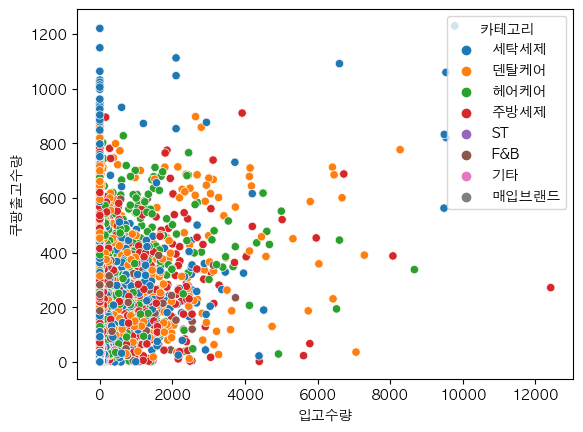

In [22]:
# 연속형 자료 시각화
sns.scatterplot(data=df5, x='입고수량', y='쿠팡출고수량', hue='카테고리')

/Users/sinhyelim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


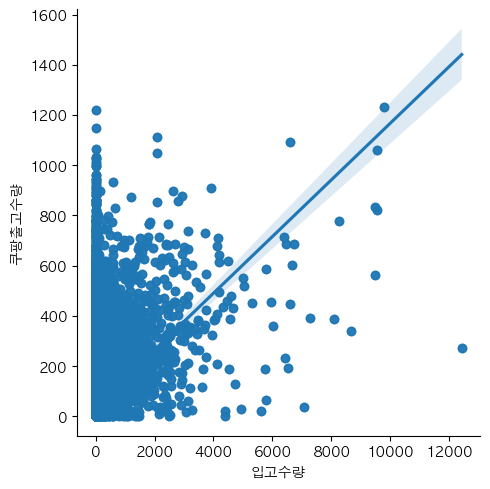

In [23]:
sns.lmplot(data=df5, x='입고수량', y='쿠팡출고수량')

/Users/sinhyelim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


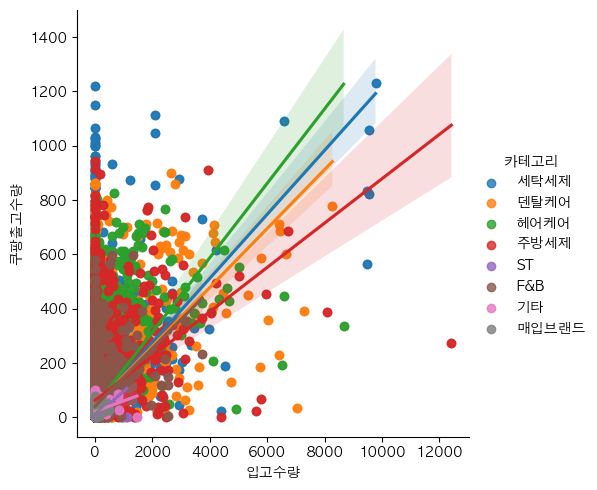

In [24]:
sns.lmplot(data=df5, x='입고수량', y='쿠팡출고수량', hue='카테고리')

<Axes: xlabel='입고수량', ylabel='쿠팡출고수량'>

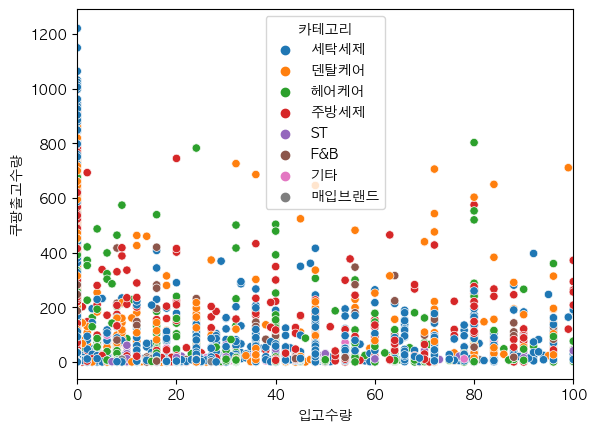

In [25]:
plt.xlim([0,100])
sns.scatterplot(data=df5, x='입고수량', y='쿠팡출고수량', hue='카테고리')

---------------------------------------------------------

In [26]:
import plotly.express as px

In [71]:
px.scatter(df5, x='입고수량', y='출고수량', color = '카테고리', trendline='ols')

# 개별미션

- 앞서 선언한 df5 데이터를 이용해 아래의 분석을 수행하고자 한다.

### 1. 2019년 5월 대비 8월의 "쿠팡출고수량"이 몇 퍼센트 증가했는지 계산하시오.

In [32]:
df5['날짜']=pd.to_datetime(df5['날짜'])
df5.head(2)

,index,Unnamed: 0,날짜,SKU ID,SKU 명,바코드,발주가능상태,입고수량,쿠팡출고수량,쿠팡현재재고수량,자재번호,자재명,카테고리,입수,출고수량,재고수량
0,0,0,2019-05-16,29349,리큐진한겔일반 3LNEW,8801046893111,발주가능,384,287,5788,6077374,19리큐 진한겔 알카2.7용기(일),세탁세제,4,71.75,80.668990
1,1,1,2019-05-16,29350,리큐 진한겔드럼 3L NEW,8801046893128,발주가능,0,235,2772,6077394,19리큐 진한겔 알카2.7용기(드),세탁세제,4,58.75,47.182979


In [33]:
cond1 = ((df5['날짜'].dt.month == 5)&(df5['날짜'].dt.year == 2019))
cond2 = ((df5['날짜'].dt.month == 8)&(df5['날짜'].dt.year == 2019))

may_data = df5.loc[cond1]
aug_data = df5.loc[cond2]

may = may_data['쿠팡출고수량'].mean()
aug = aug_data['쿠팡출고수량'].mean()

increase = ((aug-may)/may)*100
print(f'{increase}% 증가했다')

61.420043320474925% 증가했다


## 풀이

In [34]:
df3 = pd.read_csv('06_Data.csv')

In [35]:
import pandas as pd

df3['월'] = pd.to_datetime(df3['날짜']).dt.month
# T 전치 행렬 (Transpose) : 행과 열의 구조를 맞바꿈
p1 = df3.pivot_table(index='월', values='쿠팡출고수량', aggfunc='sum').T
p1

월,5,6,7,8
쿠팡출고수량,301973,608557,617329,141153


In [36]:
(p1[8] - p1[5])/(p1[5])

쿠팡출고수량   -0.532564
dtype: float64

### 2. 각 카테고리 별 5월 대비 8월의 "쿠팡출고수량"의 증감율을 계산하시오.

In [37]:
dfmay = may_data.pivot_table(index='카테고리', values = '쿠팡출고수량', aggfunc='mean')
dfaug = aug_data.pivot_table(index='카테고리', values = '쿠팡출고수량', aggfunc='mean')

In [38]:
df_2 = pd.merge(dfmay,dfaug, on='카테고리', how='inner')

In [39]:
df_2['증감율'] = ((df_2['쿠팡출고수량_y'] - df_2['쿠팡출고수량_x']) / df_2['쿠팡출고수량_x']) * 100

In [40]:
df_2

,쿠팡출고수량_x,쿠팡출고수량_y,증감율
카테고리,,,
F&B,43.067273,59.668675,38.547605
ST,2.348077,10.157233,332.576659
기타,20.587500,25.705882,24.861602
덴탈케어,43.035921,81.113757,88.479192
매입브랜드,13.820312,16.710526,20.912796
세탁세제,50.782976,59.483444,17.132646
주방세제,52.446469,93.473282,78.226073
헤어케어,43.003467,67.785024,57.626880


## 풀이

In [41]:
p2 = df3.pivot_table(index='카테고리', columns = '월', values = '쿠팡출고수량', aggfunc='sum')
(p2[8]-p2[5])/p2[5]

카테고리
F&B     -0.581838
ST      -0.338657
기타      -0.469338
덴탈케어    -0.587224
매입브랜드   -0.641040
세탁세제    -0.501493
주방세제    -0.468164
헤어케어    -0.547451
dtype: float64

### 3. '발주가능상태'에서 '발주중단' 된 데이터의 특성을 파악하고자 한다. '발주중단' 데이터만 추출하여, 카테고리의 빈도수를 확인하고, 연속형 자료의 기술통계량을 계산하시오.

In [42]:
cond3 = (df5['발주가능상태']=='발주중단')
df_3 = df5.loc[cond3]

In [43]:
df_3['카테고리'].value_counts()

카테고리
헤어케어    156
세탁세제     28
덴탈케어      6
Name: count, dtype: int64

In [44]:
df_3.describe()

,index,Unnamed: 0,날짜,SKU ID,입고수량,쿠팡출고수량,쿠팡현재재고수량,자재번호,입수,출고수량,재고수량
count,190.000000,190.000000,190,1.900000e+02,190.000000,190.000000,190.000000,1.900000e+02,190.000000,190.000000,190.000000
mean,6738.610526,28616.242105,2019-07-15 00:00:00,3.559700e+06,14.357895,10.989474,516.526316,6.038457e+06,7.515789,2.095614,318.160424
min,48.000000,15576.000000,2019-06-18 00:00:00,3.097770e+05,0.000000,0.000000,0.000000,5.008395e+06,4.000000,0.000000,0.000000
25%,4571.500000,26650.500000,2019-07-09 06:00:00,2.383418e+06,0.000000,2.000000,20.250000,6.068195e+06,4.000000,0.200000,40.154545
50%,7605.000000,29684.000000,2019-07-15 00:00:00,3.367647e+06,0.000000,8.000000,164.000000,6.075507e+06,10.000000,0.800000,210.000000
75%,9265.250000,31374.750000,2019-07-21 00:00:00,3.367649e+06,0.000000,14.750000,248.000000,6.075508e+06,10.000000,3.437500,381.653846
max,14065.000000,36563.000000,2019-08-07 00:00:00,1.023964e+07,216.000000,100.000000,3077.000000,6.075508e+06,10.000000,16.666667,2080.000000
std,3248.866340,4660.244324,NaN,2.652634e+06,40.097214,14.405683,935.948590,1.865365e+05,2.755900,2.899245,397.968950


### 4. 19년도 7월 2번째 주에 '쿠팡출고수량'이 가장 많은 '카테고리'는 무엇인지 확인하시오.

In [45]:
# 7월 2번째 주 : 7일~13일

cond4 = ((df5['날짜'].dt.month == 7) & 
         (df5['날짜'].dt.year == 2019) &
         (df5['날짜'].dt.day >= 7) & 
         (df5['날짜'].dt.day <= 13))

df_7_2 = df5.loc[cond4]

In [46]:
sorted_df = df_7_2.sort_values(by='쿠팡출고수량', ascending=False)
top_category = sorted_df.iloc[0]['카테고리']
print(top_category)

세탁세제


## 풀이

In [47]:
df3['주차'] = pd.to_datetime(df3['날짜']).dt.isocalendar().week

In [48]:
cond1 = (df3['월']==7)
cond2 = df3['주차'] == df3.loc[cond1]['주차'].unique()[1]

df3.loc[cond2].pivot_table(index='카테고리', values ='쿠팡출고수량', 
                           aggfunc='sum').sort_values(by='쿠팡출고수량',ascending=False).head(1)

,쿠팡출고수량
카테고리,
세탁세제,42675


### 5. 각 '자재명' 별 '쿠팡출고수량', '입고수량'의 평균을 계산하고, 계산된 결과에서 '쿠팡출고수량'의 상위 10% '자재명'을 'A' / 상위 30%를 'B' / 상위 60%를 'C' / 나머지를 'D'로 '등급분류'라는 파생변수를 생성하고, 각 등급에서 가장 많이 등장한 '카테고리'항목이 무엇인지 확인하시오.

In [49]:
p5 = df5.pivot_table(index='자재명', values=['쿠팡출고수량','입고수량'],aggfunc='mean')

top_10_percent = p5['쿠팡출고수량'].quantile(0.90)
top_30_percent = p5['쿠팡출고수량'].quantile(0.70)
top_60_percent = p5['쿠팡출고수량'].quantile(0.40)

In [50]:
def classify_grade(row):
    if row['쿠팡출고수량'] >= top_10_percent:
        return 'A'
    elif row['쿠팡출고수량'] >= top_30_percent:
        return 'B'
    elif row['쿠팡출고수량'] >= top_60_percent:
        return 'C'
    else:
        return 'D'

p5['등급분류'] = p5.apply(classify_grade, axis=1)

In [51]:
new_df5 = df5.merge(p5['등급분류'], on='자재명')
new_df5['카테고리'].value_counts().head(1)

카테고리
세탁세제    20678
Name: count, dtype: int64

## 풀이

In [52]:
p3 = df3.pivot_table(index=['자재명','카테고리'], values=['쿠팡출고수량','입고수량'],
                aggfunc='mean').reset_index()

In [53]:
cond1 = (p3['쿠팡출고수량'] >= p3['쿠팡출고수량'].quantile(0.90))
cond2 = (p3['쿠팡출고수량'] >= p3['쿠팡출고수량'].quantile(0.70))
cond3 = (p3['쿠팡출고수량'] >= p3['쿠팡출고수량'].quantile(0.40))

p3['등급분류'] = 'D'
p3.loc[cond3, '등급분류'] = 'C'
p3.loc[cond2, '등급분류'] = 'B'
p3.loc[cond1, '등급분류'] = 'A'
p3['등급분류'].value_counts()

등급분류
D    142
C    106
B     70
A     36
Name: count, dtype: int64

In [54]:
pd.crosstab(p3['등급분류'],p3['카테고리'])

카테고리,F&B,ST,기타,덴탈케어,매입브랜드,세탁세제,주방세제,헤어케어
등급분류,,,,,,,,
A,3,0,0,8,0,9,8,8
B,9,0,2,15,1,23,11,9
C,7,10,1,18,3,38,7,22
D,13,32,2,28,2,30,9,26


### 6. '카테고리'를 사용자로부터 입력받아, '발주가능상태'에 따른 '월'(날짜로 부터 계산) 별 '쿠팡출고수량'의 합을 계산하여 시각화 하고 해당 그래프를 '카테고리명_월별_쿠팡출고량.png'파일 형태로 저장하는 함수를 만드시오.

In [55]:
def visualize_category_sales(df):
    category = input("카테고리를 입력하세요: ")
    df_6 = df[df['카테고리'] == category]

    df_6['월'] = df_6['날짜'].dt.month

    group_data = df_6.groupby(['발주가능상태', '월'])['쿠팡출고수량'].sum().unstack()

    group_data.plot(kind='bar', stacked=True)
    plt.savefig(f"{category}_월별_쿠팡출고량.png")

## 풀이

In [56]:
def func1():
    print(df3['카테고리'].unique())
    category_input = input("카테고리를 입력하세요: ")
    cond1 = (df3['카테고리']==category_input)
    p4 = df3.loc[cond1].pivot_table(index=['발주가능상태','월'],values='쿠팡출고수량',
                                   aggfunc='sum').reset_index()
    fig1 =  px.bar(p4, x='월', y='쿠팡출고수량', color='발주가능상태')
    fig1.write_html('image.html', full_html = False, include_plotlyjs = 'cdn')

### 7. '카테고리'빈도수가 가장 많은 항목의 '입고수량'이 높은 상위 100개 데이터를 result_category.xlsx로 저장하시오.

In [57]:
df5['카테고리'].value_counts()

cond7= (df5['카테고리']=='세탁세제')

top100 = df5.loc[cond7]
top100

,index,Unnamed: 0,날짜,SKU ID,SKU 명,바코드,발주가능상태,입고수량,쿠팡출고수량,쿠팡현재재고수량,자재번호,자재명,카테고리,입수,출고수량,재고수량
0,0,0,2019-05-16,29349,리큐진한겔일반 3LNEW,8801046893111,발주가능,384,287,5788,6077374,19리큐 진한겔 알카2.7용기(일),세탁세제,4,71.750000,80.668990
1,1,1,2019-05-16,29350,리큐 진한겔드럼 3L NEW,8801046893128,발주가능,0,235,2772,6077394,19리큐 진한겔 알카2.7용기(드),세탁세제,4,58.750000,47.182979
2,2,2,2019-05-16,29351,울샴푸아웃도어 800ml 용기,8801046878934,발주가능,0,2,35,6077406,19울샴푸아웃도 800ml(리뉴얼),세탁세제,9,0.222222,157.500000
3,3,3,2019-05-16,29352,울샴푸아웃도어 1L 일자형 리필,8801046878941,발주가능,207,41,2083,6077404,19울샴푸아웃도 1L(리뉴얼),세탁세제,9,4.555556,457.243902
9,9,9,2019-05-16,34399,리큐진한겔드럼 2.1L,8801046247754,발주가능,0,62,2689,6078472,19리큐 진한겔 2.1리필(드)6입A,세탁세제,6,10.333333,260.225806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
73661,14456,22074,2019-06-30,10360964,"2080퓨어 베이킹소다 가글 750ML, 1개",8801046330302,발주가능,0,0,30,6076089,192080가글 베이킹소다750ML(클린,세탁세제,6,0.000000,0.000000
73662,14457,22075,2019-06-30,10365807,스팀클리너 10입 CASE,8801046325315,발주가능,0,3,91,5009289,18스팀클리너 9+1입 CASE,세탁세제,25,0.120000,758.333333
73663,14458,22076,2019-06-30,10371562,HUG24섬유유연제2.1L 1개입,8801046324196,발주가능,0,2,57,6072509,18 HUG24섬유유연제2.1L,세탁세제,6,0.333333,171.000000
73664,14459,22077,2019-06-30,10371563,HUG24섬유유연제2.75L 1개입,8801046324189,발주가능,0,0,58,6072506,18 HUG24섬유유연제2.75L,세탁세제,4,0.000000,0.000000


In [58]:
top100.sort_values(by='입고수량', ascending=False).head(100).to_excel('result_category.xlsx')

## 풀이

In [59]:
cond1 = (df3['카테고리'] == df3['카테고리'].value_counts().index[0])
df3.loc[cond1].sort_values(by='입고수량',
                          ascending = False).head(100).to_excel('result_category.xlsx')

### 8. 각 '카테고리'별 7월과 8월의 '쿠팡출고수량'의 평균의 차이와 합의 차이를 계산하시오.

In [60]:
cond1 = (df5['날짜'].dt.month == 7)
cond2 = (df5['날짜'].dt.month == 8)
         
jul = df5.loc[cond1]
aug = df5.loc[cond2]

mean_diff = abs(jul['쿠팡출고수량'].mean() - aug['쿠팡출고수량'].mean())
sum_diff = abs(jul['쿠팡출고수량'].sum() - aug['쿠팡출고수량'].sum())

print(f'평균의 차이는{mean_diff}입니다.')
print(f'합의 차이는 {sum_diff}입니다.')

평균의 차이는14.788545439727223입니다.
합의 차이는 952352입니다.


## 풀이

In [61]:
p4 = df3.pivot_table(index='카테고리', columns ='월', 
                values = '쿠팡출고수량', aggfunc=['sum','mean'])

p4['sum'][7] - p4['sum'][8]

카테고리
F&B       32668
ST         6768
기타         2341
덴탈케어     114295
매입브랜드      2160
세탁세제     139922
주방세제      83841
헤어케어      94181
dtype: int64

In [62]:
p4['mean'][7] - p4['mean'][8]

카테고리
F&B     -12.470227
ST       -3.915237
기타       -3.223365
덴탈케어    -21.115412
매입브랜드    -2.594365
세탁세제    -10.547251
주방세제    -17.291145
헤어케어    -15.699809
dtype: float64

### 9. '입고수량'과 '쿠팡출고수량'의 상관관계를 산점도를 이용해 시각화 하시오.

In [63]:
px.scatter(df5, x='입고수량', y='쿠팡출고수량',
           color='카테고리',size='쿠팡현재재고수량')#, facet_row='월')

In [64]:
df3['날짜_dt'] = pd.to_datetime(df3['날짜'])

In [65]:
px.line(df3, x='날짜_dt', y='쿠팡출고수량')

In [66]:
# Plotly 라이브러리의 경우 Bar Chart나 Line Chart를 그릴 땐, Pivot Table을 활용
p5 = df3.pivot_table(index=['카테고리','발주가능상태']
                     , values='쿠팡출고수량', aggfunc='sum').reset_index()
px.bar(p5, x='카테고리', y='쿠팡출고수량', color='발주가능상태')

In [67]:
p6 = df3.pivot_table(index='날짜_dt', values = '쿠팡출고수량', aggfunc='sum').reset_index()
px.line(p6, x='날짜_dt', y='쿠팡출고수량')

In [68]:
p7 = df3.pivot_table(index=['날짜_dt','카테고리'], values='쿠팡출고수량', aggfunc='sum').reset_index()

px.line(p7, x='날짜_dt', y='쿠팡출고수량', color='카테고리')

In [69]:
# 파이 차트
# 카테고리의 빈도수를 확인
v1 = df3['카테고리'].value_counts()
px.pie(v1, names=v1.index, values = v1.values)

In [70]:
# 연속형 자료 히스토그램
px.histogram(df3, x='입수',color='발주가능상태', marginal='box')

# 생산/제조에서 데이터를 보는 관점

## Q(품질) / C(비용) / D(납기)

- 품질 : 제품의 품질 수준 / 서비스의 품질 수준
    - QC7 : 특성요인도 / 관리도 / 히스토그램 / 산점도 / 체크시트 / 파레토도 / 층별화
    
- 비용 : 공장, 설비를 운용하는데 드는 비용 / 서비스를 유지,보수하는 것에 드는 비용

- 납기 : 생산된 제품을 언제까지 납품 / 언제까지 출시
    - 유통 / 서비스 배포 : 시계열 분석
    - (주문생산) / (예측생산)